# Gradient-Domain Fusion

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
#from utils import *
import os

%matplotlib inline

In [43]:
from time import process_time
import scipy.sparse as sparse
import scipy.sparse.linalg as linalg
import pyamg

## Toy Problem

In [3]:
def toy_reconstruct(toy_img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """    

    height, width = toy_img.shape
    
    im_out = np.zeros(shape=[height, width], dtype=np.double)
    
    im2var = np.arange(height * width).reshape(height, width)
    
    e = 0
    
    A = sparse.lil_matrix((height*width * 2 + 1, height*width))
    b = np.zeros((height*width * 2 + 1, 1))
    
    for x in range(width):
        for y in range(height):
            
            # Solve for Objective 1
            if x < width - 1:
                e = e + 1
                A[e, im2var[y][x+1]] = 1
                A[e, im2var[y][x]] = -1
                b[e] = toy_img[y][x+1] - toy_img[y][x] 
            
            # Solve for Objective 2
            if y < height - 1:
                e = e + 1
                A[e, im2var[y + 1, x]] = 1
                A[e, im2var[y, x]] = -1
                b[e] = toy_img[y + 1, x] - toy_img[y, x]

    # Solve for Objective 3
    e = e + 1
    A[e, im2var[0][0]] = 1
    b[e] = toy_img[0][0]
    
    v = linalg.lsqr(A, b)
      
    for x in range(width):
        for y in range(height):
            # v[0] is the element that contains "The final solution."
            # https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.linalg.lsqr.html
            im_out[y][x] = v[0][im2var[y][x]]

    return im_out

### Example 1

Elapsed process time: 80.82995600000001


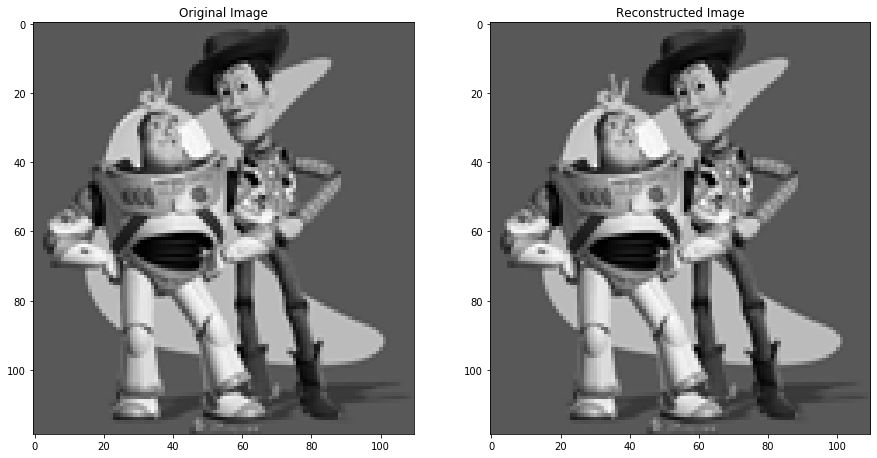

Error is: 0.00031701850082617206


In [4]:
#%matplotlib inline
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2RGB)
toy_img = cv2.cvtColor(toy_img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0

t1_start = process_time()
im_out = toy_reconstruct(toy_img)
t1_stop = process_time()

print("Elapsed process time:", t1_stop - t1_start)

fig, axes = plt.subplots(1,2, figsize = (15,15))
axes[0].set_title('Original Image')
axes[0].imshow(toy_img, cmap="gray")
axes[1].set_title('Reconstructed Image')
axes[1].imshow(im_out, cmap="gray")
plt.show()

if im_out.any():
    print("Error is:", np.sqrt(((im_out - toy_img)**2).sum()))

### Example 2

Elapsed process time: 430.26762499999995


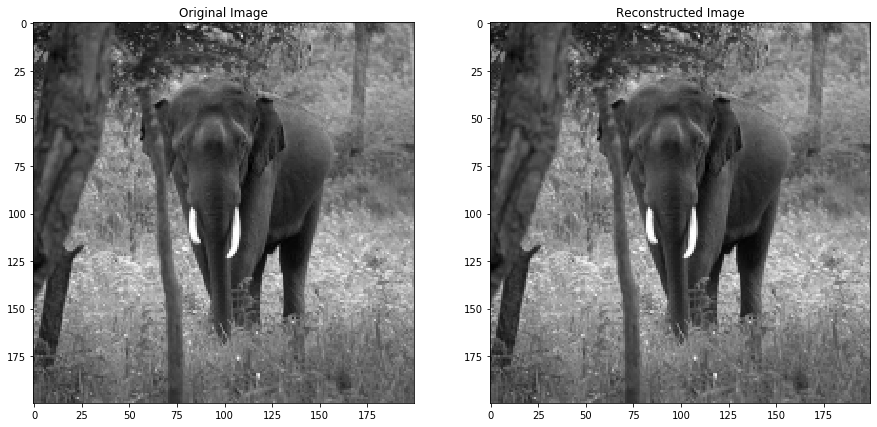

Error is: 0.0007919976403942565


In [5]:
#%matplotlib inline
elephant_img = cv2.cvtColor(cv2.imread('samples/elephant.jpg'), cv2.COLOR_BGR2RGB)
elephant_img = cv2.cvtColor(elephant_img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0

elephant_img = cv2.resize(elephant_img, (200,200))

t2_start = process_time()
elephant_out = toy_reconstruct(elephant_img)
t2_stop = process_time()

print("Elapsed process time:", t2_stop - t2_start)

fig, axes = plt.subplots(1,2, figsize = (15,15))
axes[0].set_title('Original Image')
axes[0].imshow(elephant_img, cmap="gray")
axes[1].set_title('Reconstructed Image')
axes[1].imshow(elephant_out, cmap="gray")
plt.show()

if elephant_out.any():
    print("Error is:", np.sqrt(((elephant_out - elephant_img)**2).sum()))

## Poisson Blending



In [211]:
def process_mask(mask, k=13, t=8):
    
    # Blur mask
    mask = cv2.GaussianBlur(mask, (k, k), t, cv2.BORDER_REFLECT)
    
    # "Invert" the colors of the input mask
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if not mask[i][j][0] == 255:
                mask[i][j] = 255
            else:
                mask[i][j] = 0

    # Reduce the mask to a single channel
    mask = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
    
    return mask


In [209]:
def poisson_blend(cropped_object, object_mask, background_img, offset):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    :param offset: tuple
    """

    # Convert B&W mask to Booleans
    object_mask[object_mask==0] = False
    object_mask[object_mask!=False] = True
    object_mask = object_mask.astype(np.bool)
    
    object_size = (cropped_object.shape[0], cropped_object.shape[1])

    # Generate the coefficient matrix
    A = sparse.identity(np.prod(object_size), format='lil')
    for y in range(object_size[0]):
        for x in range(object_size[1]):
            if object_mask[y,x]:
                i = x + y * object_size[1]
                A[i, i] = 4
                if i + 1 < np.prod(object_size):
                    A[i, i + 1] = -1
                if i - 1 >= 0:
                    A[i, i - 1] = -1
                if i + object_size[1] < np.prod(object_size):
                    A[i, i + object_size[1]] = -1
                if i - object_size[1] >= 0:
                    A[i, i - object_size[1]] = -1
    A = A.tocsr()

    P = pyamg.gallery.poisson(object_mask.shape)
    
    pixels = np.where(np.invert(object_mask).flatten())[0]
        
    background_img_coordinates = (
        offset[0], 
        offset[1],
        cropped_object.shape[0] + offset[0],
        cropped_object.shape[1] + offset[1])

    for c in range(background_img.shape[2]):

        t = background_img[background_img_coordinates[0]:background_img_coordinates[2],
                           background_img_coordinates[1]:background_img_coordinates[3],
                           c].flatten()
        
        # Generate b
        b = P * cropped_object[:, :, c].flatten()
        b[pixels] = t[pixels]

        # solve Ax = b
        x = sparse.linalg.spsolve(A, b)

        x = np.reshape(x, object_size)
        x = np.clip(x, 0, 255)
        x = np.array(x, background_img.dtype)
        

        # Clip high & low values
        if np.issubdtype(background_img.dtype, np.uint8):
            x[x>255] = 255
            x[x<0] = 0
        else:
            x[x>1] = 1
            x[x<0] = 0

        # Copy the solved values into the background image
        background_img[background_img_coordinates[0]:background_img_coordinates[2],
                       background_img_coordinates[1]:background_img_coordinates[3],
                       c] = x

    return background_img


### Example 1

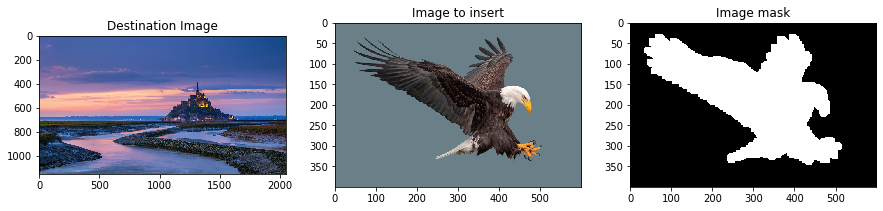

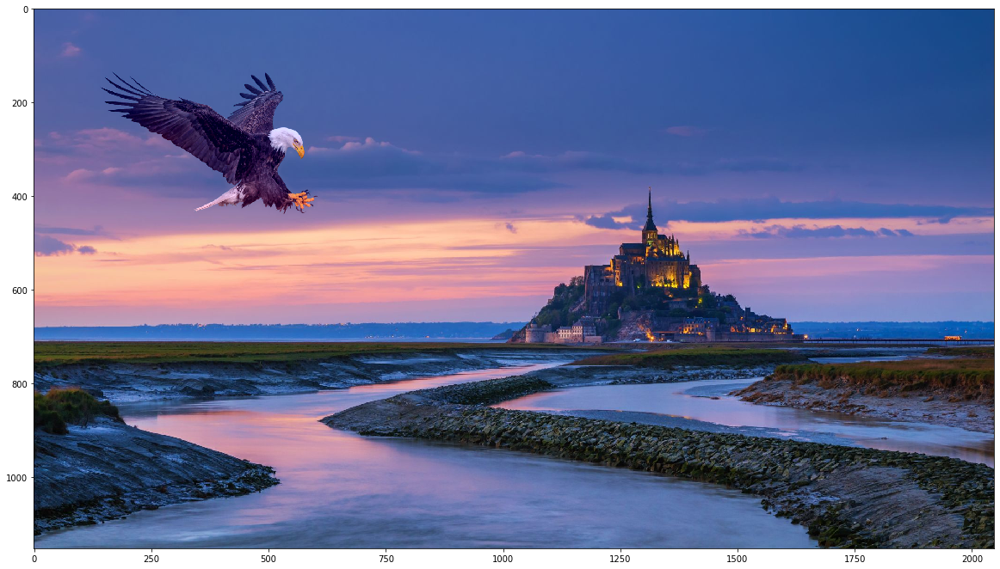

In [278]:
eagle = cv2.cvtColor(cv2.imread('samples/eagle.jpg'), cv2.COLOR_BGR2RGB)
eagle_mask = cv2.cvtColor(cv2.imread('samples/eagle_mask.jpg'), cv2.COLOR_BGR2RGB)
france = cv2.cvtColor(cv2.imread('samples/mont-saint-michel.jpeg'), cv2.COLOR_BGR2RGB)

# Resize the eagle & mask to fit in the scene
eagle = cv2.resize(eagle, (600,400))
eagle_mask = cv2.resize(eagle_mask, (600,400))
eagle_mask = process_mask(eagle_mask)

# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(france)
axes[1].set_title('Image to insert')
axes[1].imshow(eagle)
axes[2].set_title('Image mask')
axes[2].imshow(eagle_mask, cmap="gray")
plt.show()

merica = poisson_blend(eagle/255.0, eagle_mask/255.0, france/255.0, (100,100))

plt.figure(figsize = (20,20))
plt.imshow(merica)
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor((merica*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/poisson_blend_example1.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


### Example 2: Calm Under 2 Atmospheres of Presssure

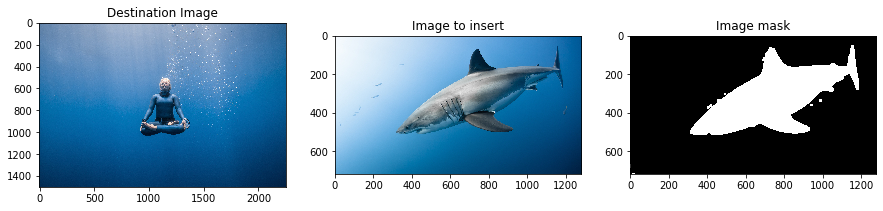

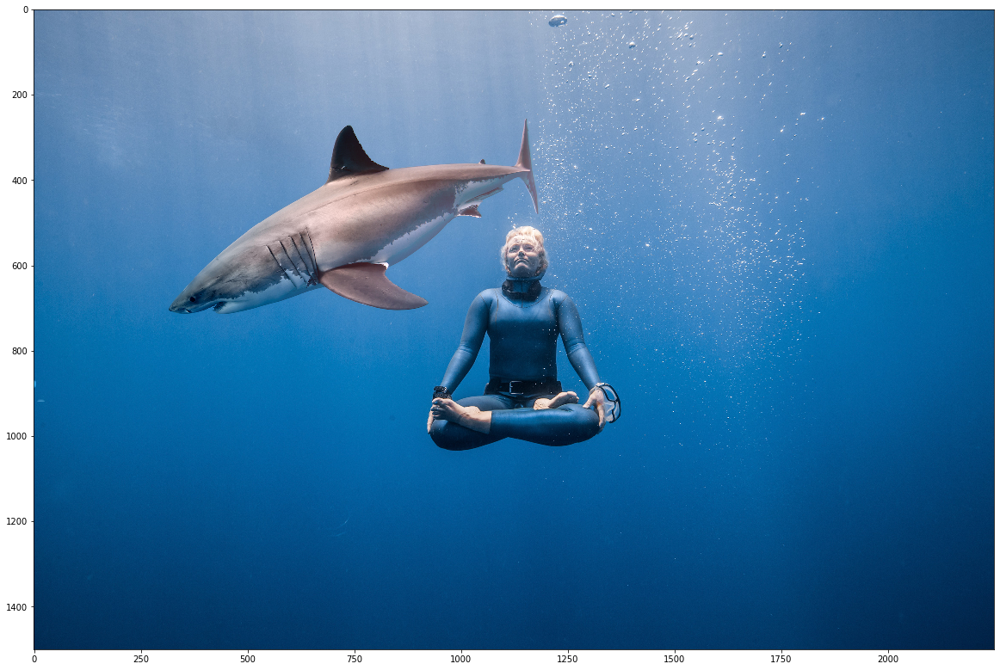

In [290]:
# Import the source images
shark = cv2.cvtColor(cv2.imread('samples/shark.jpg'), cv2.COLOR_BGR2RGB)
shark_mask = cv2.cvtColor(cv2.imread('samples/shark_mask.jpg'), cv2.COLOR_BGR2RGB)
freediver = cv2.cvtColor(cv2.imread('samples/freediver.jpg'), cv2.COLOR_BGR2RGB)

shark_mask = process_mask(shark_mask)

# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(freediver)
axes[1].set_title('Image to insert')
axes[1].imshow(shark)
axes[2].set_title('Image mask')
axes[2].imshow(shark_mask, cmap="gray")
plt.show()

shark_diver = poisson_blend(shark/255.0, shark_mask/255.0, freediver/255.0, (200,0))

# Display the result
plt.figure(figsize = (20,20))
plt.imshow(shark_diver )
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor((shark_diver*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/poisson_blend_example2.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


### Example 3: Life on Mars!

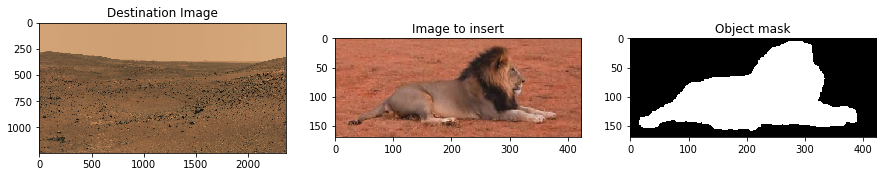

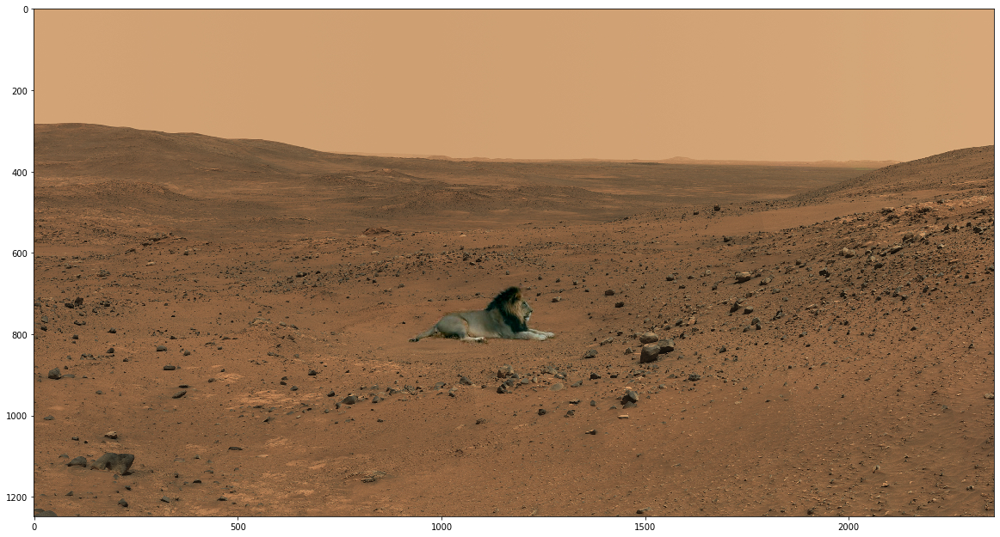

In [291]:
# Import the source images
lion = cv2.cvtColor(cv2.imread('samples/lion_mars.jpg'), cv2.COLOR_BGR2RGB)
lion_mask = cv2.cvtColor(cv2.imread('samples/lion_mars_mask.jpg'), cv2.COLOR_BGR2RGB)
mars = cv2.cvtColor(cv2.imread('samples/mars.png'), cv2.COLOR_BGR2RGB)


lion_mask = process_mask(lion_mask, 9, 4)

# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(mars)
axes[1].set_title('Image to insert')
axes[1].imshow(lion)
axes[2].set_title('Object mask')
axes[2].imshow(lion_mask, cmap="gray")
plt.show()


life_on_mars = poisson_blend(lion/255.0, lion_mask/255.0, mars/255.0, (670,900))

# Display the result
plt.figure(figsize = (20,20))
plt.imshow(life_on_mars)
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor((life_on_mars*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/poisson_blend_example3.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


## Mixed Gradients

In [327]:
def mix_blend(cropped_object, object_mask, background_img, offset):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """

    return cv2.seamlessClone(
        cropped_object,
        background_img,
        object_mask, (int(cropped_object.shape[1]/2) + offset[1],
                      int(cropped_object.shape[0]/2) + offset[0]),
        cv2.MIXED_CLONE)


### Example 1

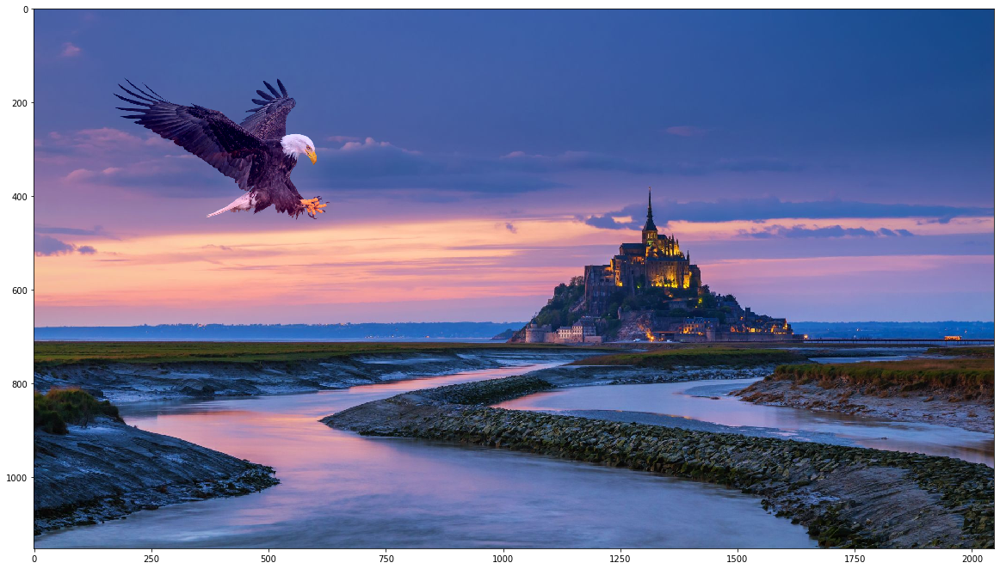

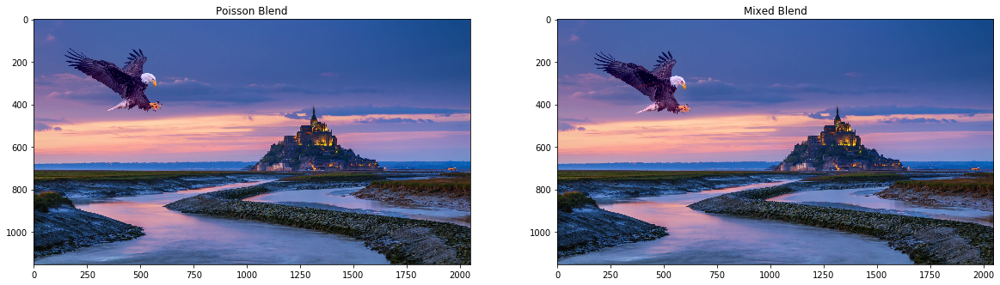

In [328]:
merica_mixed = mix_blend(eagle, eagle_mask, france, (100,100))

plt.figure(figsize = (20,20))
plt.imshow(merica_mixed)
plt.show()

fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Poisson Blend')
axes[0].imshow(merica)
axes[1].set_title('Mixed Blend')
axes[1].imshow(merica_mixed)
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor(merica_mixed, cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/mix_blend_example1.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


### Example 2

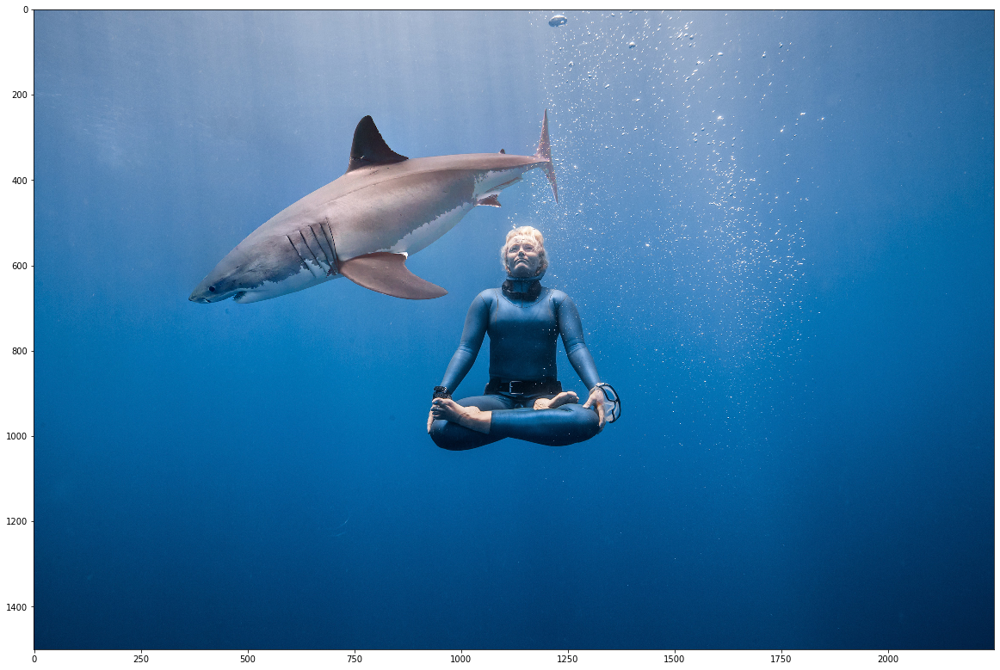

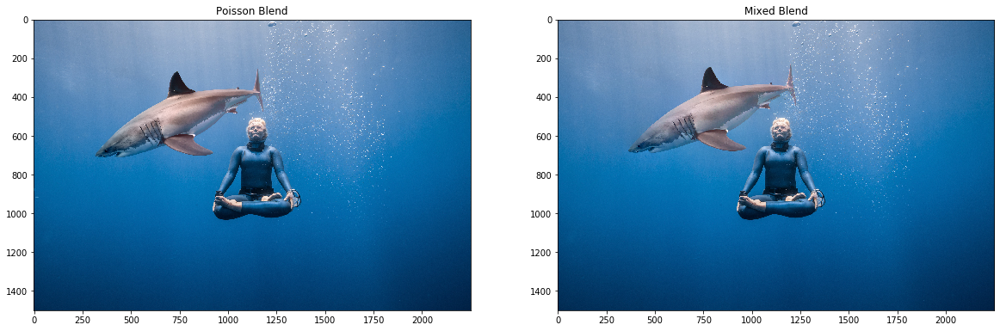

In [329]:
shark_diver_mixed = mix_blend(shark, shark_mask, freediver, (200,0))

# Display the result
plt.figure(figsize = (20,20))
plt.imshow(shark_diver_mixed)
plt.show()

fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Poisson Blend')
axes[0].imshow(shark_diver)
axes[1].set_title('Mixed Blend')
axes[1].imshow(shark_diver_mixed)
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor(shark_diver_mixed, cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/mix_blend_example2.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


### Example 3

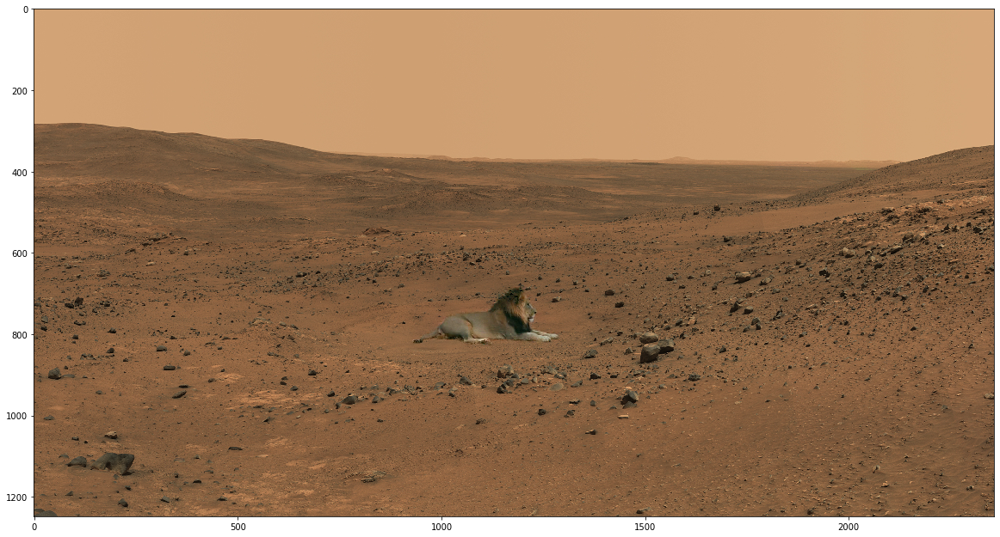

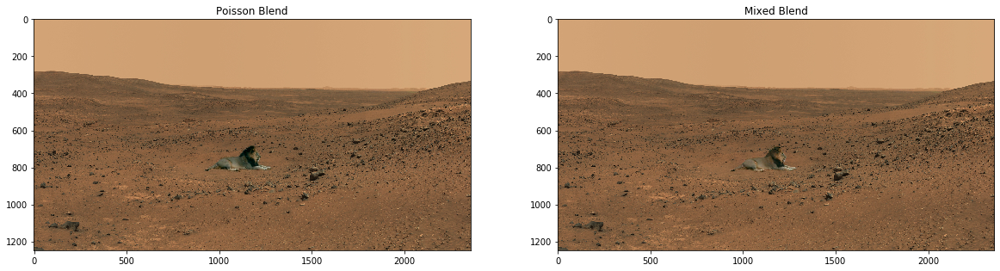

In [324]:
life_on_mars_mixed = mix_blend(lion, lion_mask, mars, (670,900))

# Display the result
plt.figure(figsize = (20,20))
plt.imshow(life_on_mars_mixed)
plt.show()

fig, axes = plt.subplots(1,2, figsize = (20,20))
axes[0].set_title('Poisson Blend')
axes[0].imshow(life_on_mars)
axes[1].set_title('Mixed Blend')
axes[1].imshow(life_on_mars_mixed)
plt.show()

if os.path.isdir('./results'):
    outputfile = cv2.cvtColor(life_on_mars_mixed, cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/mix_blend_example3.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


## Laplacian pyramid blending


In [233]:
def make_gaussian_pyramid(im, levels):
    l = im.copy()
    p = [l]
    for i in range(levels):
        l = cv2.pyrDown(l)
        p.append(l)
    return p


In [234]:
def make_laplacian_pyramid(gaussian):
    t = gaussian[-1]
    p = [t] 
    for i in range(len(gaussian) - 1, 0, -1):
        size = (gaussian[i - 1].shape[1], gaussian[i - 1].shape[0])
        gaussian_expanded = cv2.pyrUp(gaussian[i], dstsize=size)
        laplacian = np.subtract(gaussian[i - 1], gaussian_expanded)
        p.append(laplacian)
    return p


In [272]:
def laplacian_blend(img1, img2, mask):
    
    # Tunable levels
    levels = 8

    # Make Gaussian pyramids from source images
    gaussian_img1 = make_gaussian_pyramid(img1, levels)
    gaussian_img2 = make_gaussian_pyramid(img2, levels)
    gaussian_mask = make_gaussian_pyramid(mask, levels)
    
    # Make Laplacian pyramids from source images
    laplacian_img1 = make_laplacian_pyramid(gaussian_img1)
    laplacian_img2 = make_laplacian_pyramid(gaussian_img2)
    
    LS = []
    gaussian_mask.reverse()
    for la,lb,m in zip(laplacian_img1,laplacian_img2,gaussian_mask):
        ls = lb * m + la * (1.0 - m)
        LS.append(ls)

    t = LS[0]
    l = [t]

    for i in range(len(LS) - 1):
        size = (LS[i + 1].shape[1], LS[i + 1].shape[0])
        laplacian_expanded = cv2.pyrUp(t, dstsize=size)
        t = cv2.add(LS[i + 1], laplacian_expanded)
        l.append(t)

    im = l[levels]
    
    # Clip high & low values
    if np.issubdtype(im.dtype, np.uint8):
            im[im>255] = 255
            im[im<0] = 0
    else:
            im[im>1] = 1
            im[im<0] = 0

    return im


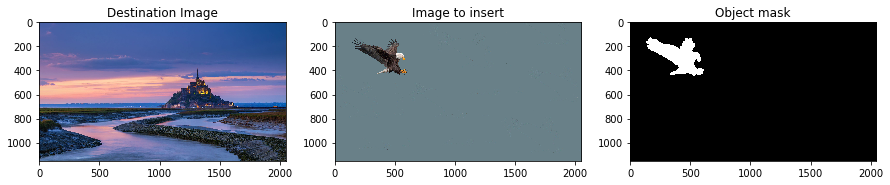

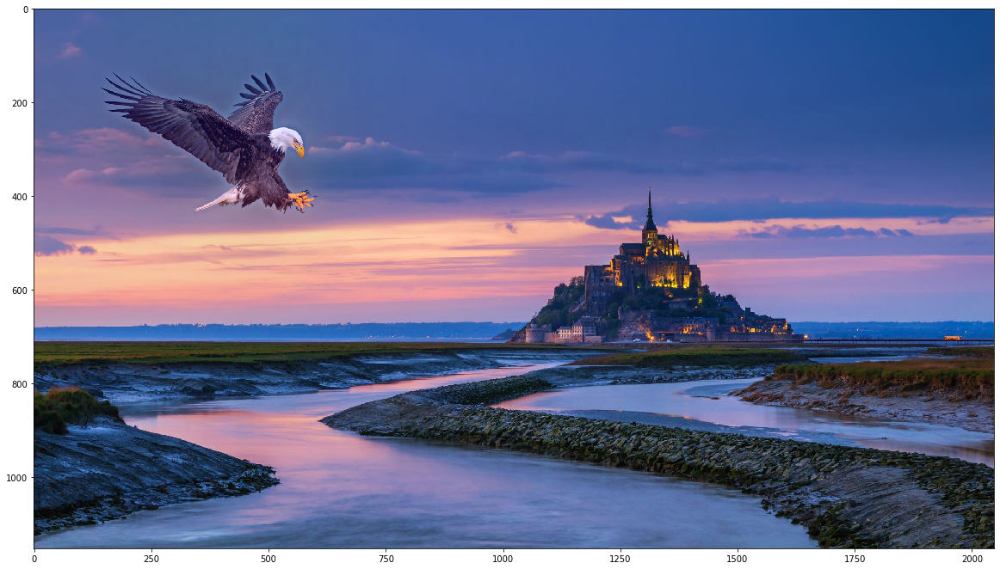

In [285]:
img1 = cv2.cvtColor(cv2.imread('samples/mont-saint-michel.jpeg'), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread('samples/eagle_pyr.jpg'), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread('samples/eagle_pyr_mask.jpg'), cv2.COLOR_BGR2RGB)

#mask = cv2.GaussianBlur(mask, (5, 5), 2, cv2.BORDER_REFLECT)
mask = cv2.GaussianBlur(mask, (13, 13), 8, cv2.BORDER_REFLECT)
shape = mask.shape
for i in range(shape[0]):
    for j in range(shape[1]):
        if not mask[i][j][0] == 255:
            mask[i][j] = 255
        else:
            mask[i][j] = 0



# Display the precursor images
fig, axes = plt.subplots(1,3, figsize = (15,15))
axes[0].set_title('Destination Image')
axes[0].imshow(img1)
axes[1].set_title('Image to insert')
axes[1].imshow(img2)
axes[2].set_title('Object mask')
axes[2].imshow(mask, cmap="gray")
plt.show()




final = laplacian_blend(img1/255.0, img2/255.0, mask/255.0)

plt.figure(figsize = (20,20))
plt.imshow(final)
plt.show()


if os.path.isdir('./results'):
    outputfile = cv2.cvtColor((final*255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    cv2.imwrite('./results/laplacian_blend_example1.jpg',
                outputfile,
                [int(cv2.IMWRITE_JPEG_QUALITY), 100])


## More gradient domain processing
Many other applications are possible, including non-photorealistic rendering, edge enhancement, and texture or color transfer. See Perez et al. 2003 or Gradient Shop for further ideas.

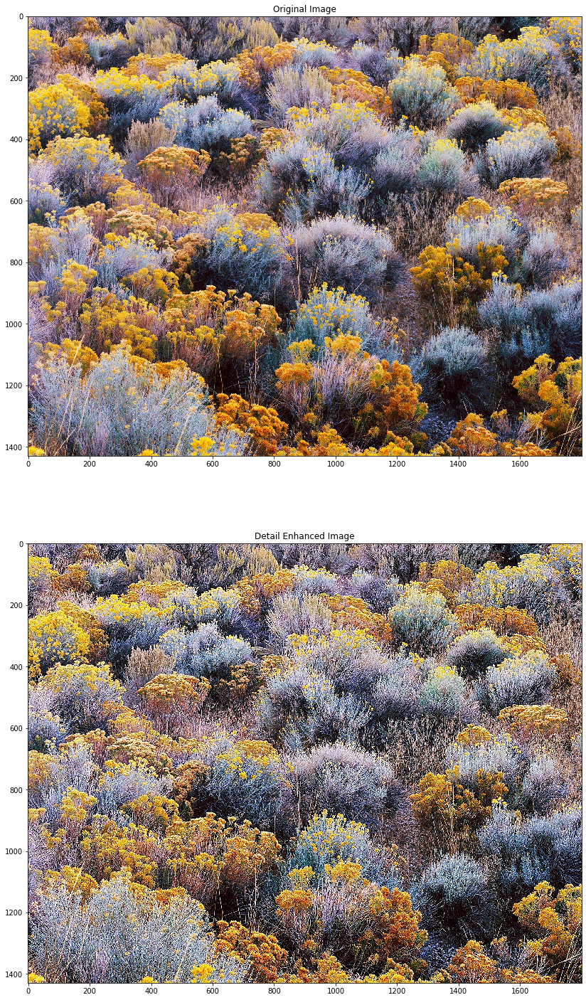

In [286]:
# edge enhancement
rabbitbrush = cv2.cvtColor(cv2.imread('samples/rabbitbrush.jpg'), cv2.COLOR_BGR2RGB)
detail_enhance = cv2.detailEnhance(rabbitbrush, sigma_s=2, sigma_r=0.75)

# Display the precursor images
fig, axes = plt.subplots(2,1, figsize = (25,25))
axes[0].set_title('Original Image')
axes[0].imshow(rabbitbrush)
axes[1].set_title('Detail Enhanced Image')
axes[1].imshow(detail_enhance)
plt.show()


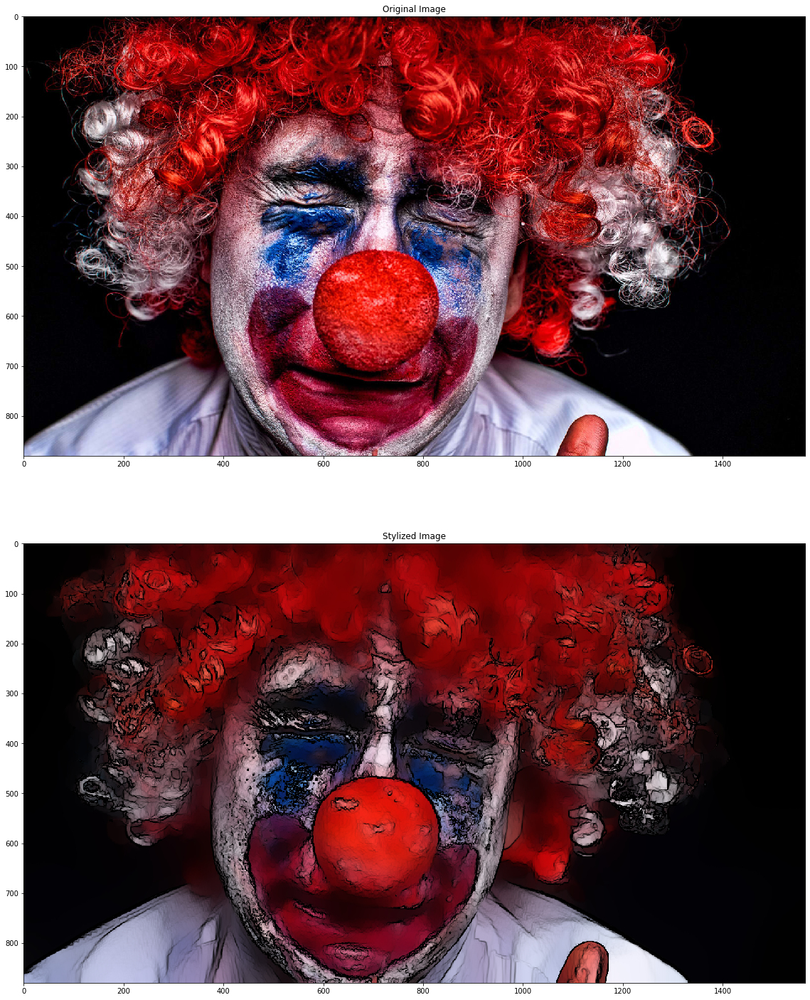

In [287]:
# non-photorealistic rendering
clown = cv2.cvtColor(cv2.imread('samples/misunderstood-clowns.jpg'), cv2.COLOR_BGR2RGB)

sad_clown = cv2.stylization(clown, sigma_s=60, sigma_r=0.8)


# Display the precursor images
fig, axes = plt.subplots(2,1, figsize = (25,25))
axes[0].set_title('Original Image')
axes[0].imshow(clown)
axes[1].set_title('Stylized Image')
axes[1].imshow(sad_clown)
plt.show()


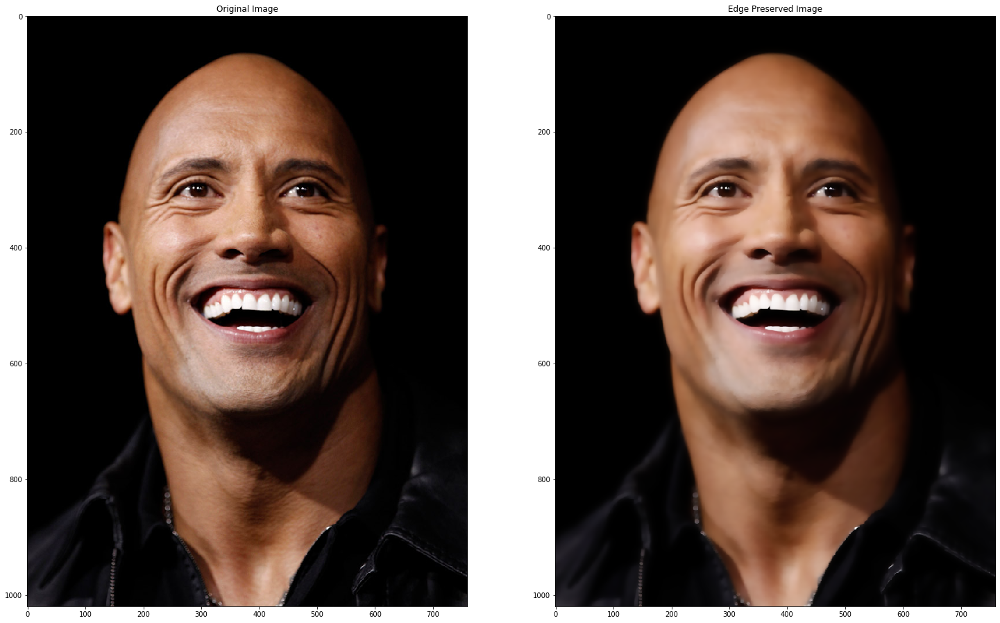

In [331]:
therock = cv2.cvtColor(cv2.imread('samples/therock.jpg'), cv2.COLOR_BGR2RGB)

with_makeup = cv2.edgePreservingFilter(therock, flags=1, sigma_s=5, sigma_r=0.5)

# Display the precursor images
fig, axes = plt.subplots(1,2, figsize = (25,25))
axes[0].set_title('Original Image')
axes[0].imshow(therock)
axes[1].set_title('Edge Preserved Image')
axes[1].imshow(with_makeup)
plt.show()
